In [2]:
using DrWatson
@quickactivate "Doran_etal_2022"

In [3]:
using SPI
using Muon, CSV, DataFrames
using NewickTree, NewickTreeTools
using StatsPlots
theme(:default, grid=false, label="")

In [4]:
ddir = datadir("exp_pro", "UP7047")
tdir = projectdir("_research", "UP7047_neighborjoined_spitree")
pdir = plotsdir("conserved_oggs_in_uniprot") |> mkpath

"/Users/ben/projects/Doran_etal_2022/plots/conserved_oggs_in_uniprot"

In [5]:
uniprot = readh5ad(joinpath(ddir, "2020_02_UP7047.h5ad"))
uptree_full = readnw(readline(joinpath(tdir, "2020_02_UP7047-supporttree.nw")))
uptree = as_polytomy(x->NewickTree.support(x) < 0.5, uptree_full)

((((((((((((((((UP000220251:0.3681296,UP000000495:0.7054831,UP000031552:0.4500539)0.71:0.07324412,UP000001505:0.515416)0.8366666666666667:0.05146068,(UP000000529:0.8304454,UP000069902:0.4625929)0.63:0.132667)0.874:0.0437504,UP000031320:0.5283071)0.975:0.06329066,UP000000496:1.215079)0.9428571428571428:0.1666593,UP000196763:0.3919022)0.8725:0.02545351,UP000253816:0.1724787,UP000000431:0.3050015)0.866:0.01776252,UP000196862:0.3726263,UP000196784:0.2678048)0.9575:0.07027833,UP000185544:0.591453)0.8838461538461538:0.01360717,UP000218046:0.4953882,UP000053785:0.4936864)0.766:0.004803309,((((UP000035039:0.345209,UP000029283:1.035116)0.77:0.08784236,UP000035018:0.5590247)0.885:0.2052429,UP000053697:0.3172342)0.7433333333333334:0.03277148,UP000242542:0.4476391)0.6775:0.03476413,(UP000195277:0.593108,UP000242922:0.662811)0.56:0.04725994)0.5272727272727273:0.00202137,(((((((((((((((((UP000002523:1.000336,UP000008323:0.05665735)0.89:0.2533052,UP000283896:0.0)1.0:0.206037,UP000037386:0.07790443)1.

In [6]:
upmtx = uniprot.X[:,:];

In [7]:
leafnodes = getleaves(uptree)
leafnames = getleafnames(uptree);

# E. rectale

In [224]:
treeorder = indexin(getleafnames(uptree), uniprot.obs_names);
species_name = "rectale"
chosen_oggs = [
    "COG0835",
    "COG0842",
    "COG1345",
    "COG1344",
    "COG1442",
    "COG1516",
    "COG1776",
    "COG2186",
    "COG2198",
    # "COG2405",
    # "COG2865",
    "COG2944",
    # "COG3210",
    # "COG3316",
    "COG3547",
    # "COG4495",
    "COG4786",
    "COG5001",
    "COG5279",
    "COG5444",
];
chosen_oggs_idx = indexin(chosen_oggs, uniprot.var_names);
subset_ogg_mtx = upmtx[:, chosen_oggs_idx] .> 0;

foundtaxa = uniprot.obs[contains.(uniprot.obs.Species, species_name), [:Kingdom, :Phylum, :Class, :Order, :Family, :Genus, :Species]]

@info "string: '$(species_name)' finds $(nrow(foundtaxa)) taxa:\n$(foundtaxa)"

species_node_idx = findall(contains.(uniprot.obs.Species[treeorder], species_name))[1]
speciesnode = leafnodes[species_node_idx]
depthofspecies = network_distance(uptree, speciesnode)
speciesparents = []
node = speciesnode
for i in 1:depthofspecies
    node = parent(node)
    push!(speciesparents, node)
end

cladesizes = length.(getleafnames.(speciesparents))
@info "# of taxa per clade = $(cladesizes)"

cladesateachtreelevel = getleafnames.(speciesparents);
frac_present = map(cladesateachtreelevel) do clade_ids
    cladeidx = indexin(clade_ids, uniprot.obs_names)
    mean(subset_ogg_mtx[cladeidx, :], dims=1) |> vec
end |> stack
islocallypresent = frac_present[:, 1] .== 1;

@info "# locally present = $(sum(islocallypresent)), # not locally present = $(sum(.!islocallypresent))"

┌ Info: string: 'rectale' finds 1 taxa:
│ 1×7 DataFrame
│  Row │ Kingdom   Phylum      Class       Order          Family           Genus   Species
│      │ String    String      String      String         String           String  String
│ ─────┼─────────────────────────────────────────────────────────────────────────────────────────────────
│    1 │ Bacteria  Firmicutes  Clostridia  Clostridiales  Lachnospiraceae          [Eubacterium] rectale
└ @ Main /Users/ben/projects/Doran_etal_2022/notebooks/reports/16_uniprot_conservation_of_motility.ipynb:30
┌ Info: # of taxa per clade = [3, 10, 23, 101, 216, 265, 380, 600, 733, 1022, 1065, 2376, 6709, 7047]
└ @ Main /Users/ben/projects/Doran_etal_2022/notebooks/reports/16_uniprot_conservation_of_motility.ipynb:43


┌ Info: # locally present = 12, # not locally present = 3
└ @ Main /Users/ben/projects/Doran_etal_2022/notebooks/reports/16_uniprot_conservation_of_motility.ipynb:52


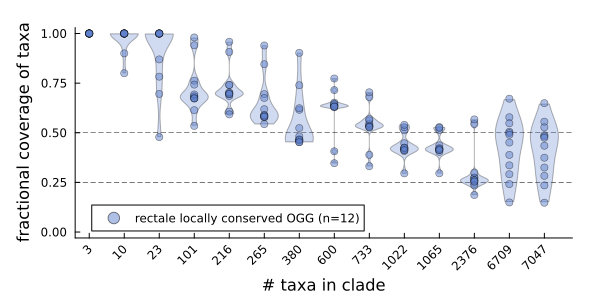

In [225]:
numcols = length(cladesizes)

plot(#title="'Motility' OGGs by tree depth",
    xticks=(1:numcols, string.(cladesizes)),
    xrotation=45,
    ylabel="fractional coverage of taxa",
    xlabel="# taxa in clade",
    margin=5Plots.Measures.mm,
    ylims=(0,1), widen=true,
    size=(600,300),
    # xflip=true
    legend=:bottomleft,
)
hline!([.25,.5], c=:black, lw=.5, linestyle=:dash)
# violin!(permutedims(1:numcols), frac_present[.!islocallypresent, :], alpha=.3, c=:grey)
violin!(permutedims(1:numcols), frac_present[islocallypresent, :], alpha=.3, c="#6182ce")
# plot!(frac_present[.!islocallypresent, :]', c=:grey, alpha=0.2)
# plot!(frac_present[islocallypresent, :]', c="#6182ce", alpha=0.2)
# dotplot!(permutedims(1:numcols), frac_present[.!islocallypresent, :], c=:grey, alpha=.3, mode=:none,)
dotplot!(permutedims(1:numcols), frac_present[islocallypresent, :], c="#6182ce", alpha=.5, mode=:none, )
# scatter!([NaN NaN], label=["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))" "$(species_name) locally conserved OGG (n=$(sum(.!islocallypresent)))"], c=["#6182ce" :grey], alpha=[.5 0.3])
scatter!([NaN], label=permutedims(["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))"]), c=["#6182ce"], alpha=[0.5] )
# hline!([.5])

In [219]:
savefig(joinpath(pdir, "$(species_name)_conservationbySPItree_withouttracelines.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/conserved_oggs_in_uniprot/rectale_conservationbySPItree_withouttracelines.pdf"

In [220]:
globallyconserved = frac_present[islocallypresent, 14] .> .5;
mostlyconserved =.25 .< frac_present[islocallypresent, 14] .< .5;
lessconserved = frac_present[islocallypresent, 14] .< .25;

In [221]:
uniprot.var.description[indexin(chosen_oggs[islocallypresent][globallyconserved], uniprot.var_names)]

3-element Vector{String}:
 "Histidine kinase"
 "Transposase (IS116 IS110 IS902 family)"
 "cyclic-guanylate-specific phosphodiesterase activity"

In [222]:
uniprot.var.description[indexin(chosen_oggs[islocallypresent][mostlyconserved], uniprot.var_names)]

7-element Vector{String}:
 "chemotaxis"
 "Required for morphogenesis and " ⋯ 281 bytes ⋯ "lymerization at the distal end"
 "bacterial-type flagellum-dependent cell motility"
 "lipopolysaccharide 3-alpha-galactosyltransferase activity"
 "flagellar protein fliS"
 "sequence-specific DNA binding"
 "Flagellar basal body rod"

In [223]:
uniprot.var.description[indexin(chosen_oggs[islocallypresent][lessconserved], uniprot.var_names)]

2-element Vector{String}:
 "chemotaxis"
 "protein involved in cytokinesis" ⋯ 23 bytes ⋯ "utaminase protease-like) domain"

In [214]:
uniprot.var.description[indexin(chosen_oggs[islocallypresent], uniprot.var_names)]

12-element Vector{String}:
 "chemotaxis"
 "Required for morphogenesis and " ⋯ 281 bytes ⋯ "lymerization at the distal end"
 "bacterial-type flagellum-dependent cell motility"
 "lipopolysaccharide 3-alpha-galactosyltransferase activity"
 "flagellar protein fliS"
 "chemotaxis"
 "Histidine kinase"
 "sequence-specific DNA binding"
 "Transposase (IS116 IS110 IS902 family)"
 "Flagellar basal body rod"
 "cyclic-guanylate-specific phosphodiesterase activity"
 "protein involved in cytokinesis" ⋯ 23 bytes ⋯ "utaminase protease-like) domain"

# Rectale pie chart

In [45]:
pie([28, 6], c=["#6182ce", "#cead61"])
savefig(joinpath(pdir, "rectale_piechart.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/conserved_oggs_in_uniprot/rectale_piechart.pdf"

# B. vulgatus

In [53]:
treeorder = indexin(getleafnames(uptree), uniprot.obs_names);
species_name = "vulgatus"
chosen_oggs = [
    "COG0863",
    "COG1083",
    "COG4744",
    "32ZV1",
    "COG0666",
    "COG2214",
    "2Z8QV",
];
chosen_oggs_idx = indexin(chosen_oggs, uniprot.var_names);
subset_ogg_mtx = upmtx[:, chosen_oggs_idx] .> 1;

foundtaxa = uniprot.obs[contains.(uniprot.obs.Species, species_name), [:Kingdom, :Phylum, :Class, :Order, :Family, :Genus, :Species]]

@info "string: '$(species_name)' finds $(nrow(foundtaxa)) taxa:\n$(foundtaxa)"

species_node_idx = findall(contains.(uniprot.obs.Species[treeorder], species_name))[1]
speciesnode = leafnodes[species_node_idx]
depthofspecies = network_distance(uptree, speciesnode)
speciesparents = []
node = speciesnode
for i in 1:depthofspecies
    node = parent(node)
    push!(speciesparents, node)
end

cladesizes = length.(getleafnames.(speciesparents))
@info "# of taxa per clade = $(cladesizes)"

cladesateachtreelevel = getleafnames.(speciesparents);
frac_present = map(cladesateachtreelevel) do clade_ids
    cladeidx = indexin(clade_ids, uniprot.obs_names)
    mean(subset_ogg_mtx[cladeidx, :], dims=1) |> vec
end |> stack
islocallypresent = frac_present[:, 1] .== 1;

@info "# locally present = $(sum(islocallypresent)), # not locally present = $(sum(.!islocallypresent))"

┌ Info: string: 'vulgatus' finds 1 taxa:
│ 1×7 DataFrame
│  Row │ Kingdom   Phylum         Class        Order          Family          Genus        Species
│      │ String    String         String       String         String          String       String
│ ─────┼────────────────────────────────────────────────────────────────────────────────────────────────────────
│    1 │ Bacteria  Bacteroidetes  Bacteroidia  Bacteroidales  Bacteroidaceae  Bacteroides  Bacteroides vulgatus
└ @ Main /Users/ben/projects/Doran_etal_2022/notebooks/reports/16_uniprot_conservation_of_motility.ipynb:17
┌ Info: # of taxa per clade = [10, 14, 15, 18, 25, 33, 42, 49, 50, 67, 144, 171, 210, 468, 1683, 4333, 6709, 7047]
└ @ Main /Users/ben/projects/Doran_etal_2022/notebooks/reports/16_uniprot_conservation_of_motility.ipynb:30


┌ Info: # locally present = 0, # not locally present = 7
└ @ Main /Users/ben/projects/Doran_etal_2022/notebooks/reports/16_uniprot_conservation_of_motility.ipynb:39


In [ ]:
uniprot.var.description[indexin(chosen_oggs, uniprot.var_names)]

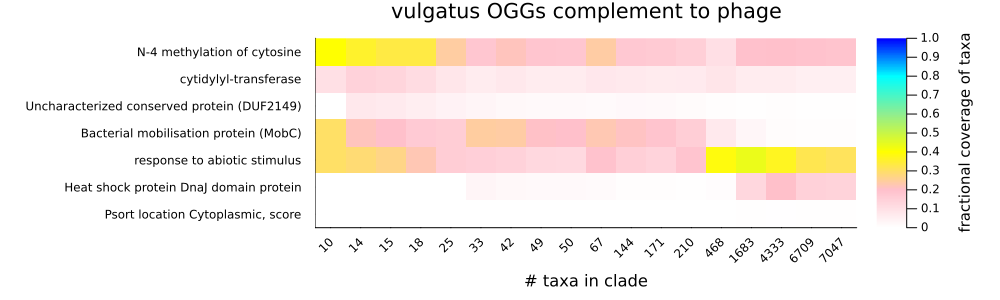

In [105]:
plot(title="$(species_name) OGGs complement to phage",
    xticks=(1:numcols, string.(cladesizes)),
    xrotation=45,
    colorbartitle="fractional coverage of taxa",
    xlabel="# taxa in clade",
    margin=5Plots.Measures.mm,
    bottommargin=10Plots.Measures.mm,
    clims=(0,1), 
    # widen=true,
    size=(1000,300),
    # xflip=true
)
heatmap!(frac_present, 
    clims=(0,1),
    yflip=true,
    c=[:white, :pink, :yellow, :lightgreen, :cyan, :blue],
    yticks=(1:length(chosen_oggs), uniprot.var.description[indexin(chosen_oggs, uniprot.var_names)]),
    size=(1000, 300),
)

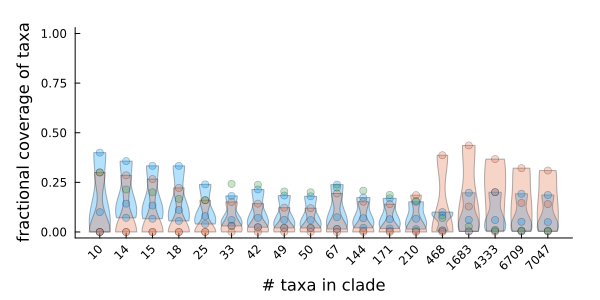

In [103]:
numcols = length(cladesizes)

plot(#title="'Motility' OGGs by tree depth",
    xticks=(1:numcols, string.(cladesizes)),
    xrotation=45,
    ylabel="fractional coverage of taxa",
    xlabel="# taxa in clade",
    margin=5Plots.Measures.mm,
    ylims=(0,1), widen=true,
    size=(600,300),
    # xflip=true
)
violin!(permutedims(1:numcols), frac_present[[true, true, true, false, false, false, false], :], alpha=.3, c=1)
violin!(permutedims(1:numcols), frac_present[[false, false, false, false, true, true, true], :], alpha=.3, c=2)
violin!(permutedims(1:numcols), frac_present[[false, false, false, true, false, false, false], :], alpha=.3, c=3)
# violin!(permutedims(1:numcols), frac_present[islocallypresent, :], alpha=.3, c="#6182ce")
# plot!(frac_present[.!islocallypresent, :]', c=:grey, alpha=0.2)
# plot!(frac_present[islocallypresent, :]', c="#6182ce", alpha=0.2)
# dotplot!(permutedims(1:numcols), frac_present[.!islocallypresent, :], c=:grey, alpha=.3, mode=:none,)
dotplot!(permutedims(1:numcols), frac_present[[true, true, true, false, false, false, false], :], mode=:none, alpha=.3, c=1)
dotplot!(permutedims(1:numcols), frac_present[[false, false, false, false, true, true, true], :], mode=:none, alpha=.3, c=2)
dotplot!(permutedims(1:numcols), frac_present[[false, false, false, true, false, false, false], :], mode=:none, alpha=.3, c=3)
# dotplot!(permutedims(1:numcols), frac_present[islocallypresent, :], c="#6182ce", alpha=.5, mode=:none, )
# scatter!([NaN NaN], label=["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))" "$(species_name) not locally conserved OGG (n=$(sum(.!islocallypresent)))"], c=["#6182ce" :grey], alpha=[.5 0.3])
# scatter!([NaN], label=permutedims(["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))"]), c=["#6182ce"], alpha=[0.5] )

In [ ]:
savefig(joinpath(pdir, "$(species_name)_conservationbySPItree_withouttracelines.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/conserved_oggs_in_uniprot/rectale_conservationbySPItree_withouttracelines.pdf"

In [64]:
frac_present[:, lastindex(frac_present, 2)]

7-element Vector{Float64}:
 0.18674613310628635
 0.04995033347523769
 0.004399035050376046
 0.006811409110259685
 0.3096353058038882
 0.14062721725556976
 0.0028380871292748686

In [69]:
uniprot.var.description[indexin(chosen_oggs[sortperm(frac_present[:, lastindex(frac_present, 2)], rev=true)], uniprot.var_names)]

7-element Vector{String}:
 "response to abiotic stimulus"
 "N-4 methylation of cytosine"
 "Heat shock protein DnaJ domain protein"
 "cytidylyl-transferase"
 "Bacterial mobilisation protein (MobC)"
 "Uncharacterized conserved protein (DUF2149)"
 "Psort location Cytoplasmic, score"

# Thetaiotaomicron

In [34]:
treeorder = indexin(getleafnames(uptree), uniprot.obs_names);
species_name = "thetaiotaomicron"
chosen_oggs = [
    "COG2333",
    "COG3500",
    "COG3501",
    "COG3516",
    "COG3519",
    "COG3522",
    "COG3628",
    "COG4085",
    "COG4464",
    "2Z8BB",
    "2Z8M7",
    "2ZANB",
    "30R27",
    "33B33",
];
chosen_oggs_idx = indexin(chosen_oggs, uniprot.var_names);
subset_ogg_mtx = upmtx[:, chosen_oggs_idx] .> 1;

foundtaxa = uniprot.obs[contains.(uniprot.obs.Species, species_name), [:Kingdom, :Phylum, :Class, :Order, :Family, :Genus, :Species]]

@info "string: '$(species_name)' finds $(nrow(foundtaxa)) taxa:\n$(foundtaxa)"

species_node_idx = findall(contains.(uniprot.obs.Species[treeorder], species_name))[1]
speciesnode = leafnodes[species_node_idx]
depthofspecies = network_distance(uptree, speciesnode)
speciesparents = []
node = speciesnode
for i in 1:depthofspecies
    node = parent(node)
    push!(speciesparents, node)
end

cladesizes = length.(getleafnames.(speciesparents))
@info "# of taxa per clade = $(cladesizes)"

cladesateachtreelevel = getleafnames.(speciesparents);
frac_present = map(cladesateachtreelevel) do clade_ids
    cladeidx = indexin(clade_ids, uniprot.obs_names)
    mean(subset_ogg_mtx[cladeidx, :], dims=1) |> vec
end |> stack
islocallypresent = frac_present[:, 1] .== 1;

@info "# locally present = $(sum(islocallypresent)), # not locally present = $(sum(.!islocallypresent))"

┌ Info: string: 'thetaiotaomicron' finds 2 taxa:
│ 2×7 DataFrame
│  Row │ Kingdom   Phylum         Class        Order          Family          Genus        Species
│      │ String    String         String       String         String          String       String
│ ─────┼────────────────────────────────────────────────────────────────────────────────────────────────────────────────
│    1 │ Bacteria  Bacteroidetes  Bacteroidia  Bacteroidales  Bacteroidaceae  Bacteroides  Bacteroides thetaiotaomicron
│    2 │ Bacteria  Bacteroidetes  Bacteroidia  Bacteroidales  Bacteroidaceae  Bacteroides  Bacteroides thetaiotaomicron
└ @ Main /Users/ben/projects/Doran_etal_2022/notebooks/reports/16_uniprot_conservation_of_motility.ipynb:24
┌ Info: # of taxa per clade = [2, 4, 5, 6, 7, 9, 10, 14, 15, 18, 25, 33, 42, 49, 50, 67, 144, 171, 210, 468, 1683, 4333, 6709, 7047]
└ @ Main /Users/ben/projects/Doran_etal_2022/notebooks/reports/16_uniprot_conservation_of_motility.ipynb:37


┌ Info: # locally present = 1, # not locally present = 13
└ @ Main /Users/ben/projects/Doran_etal_2022/notebooks/reports/16_uniprot_conservation_of_motility.ipynb:46


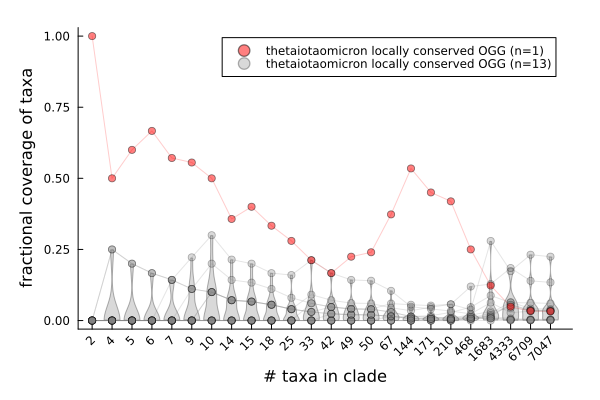

In [35]:
numcols = length(cladesizes)

plot(#title="'Motility' OGGs by tree depth",
    xticks=(1:numcols, string.(cladesizes)),
    xrotation=45,
    ylabel="fractional coverage of taxa",
    xlabel="# taxa in clade",
    margin=5Plots.Measures.mm,
    ylims=(0,1), widen=true,
)
violin!(permutedims(1:numcols), frac_present[.!islocallypresent, :], alpha=.3, c=:grey)
violin!(permutedims(1:numcols), frac_present[islocallypresent, :], alpha=.3, c=:pink)
plot!(frac_present[islocallypresent, :]', c=:red, alpha=0.2)
plot!(frac_present[.!islocallypresent, :]', c=:grey, alpha=0.2)
dotplot!(permutedims(1:numcols), frac_present[.!islocallypresent, :], c=:grey, alpha=.3, mode=:none,)
dotplot!(permutedims(1:numcols), frac_present[islocallypresent, :], c=:red, alpha=.5, mode=:none, )
scatter!([NaN NaN], label=["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))" "$(species_name) locally conserved OGG (n=$(sum(.!islocallypresent)))"], c=[:red :grey], alpha=[.5 0.3])
# scatter!([NaN], label=permutedims(["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))"]), c=[:red], alpha=[0.5])

In [140]:
savefig(joinpath(pdir, "$(species_name)_conservationbySPItree_withtracelines.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/conserved_oggs_in_uniprot/thetaiotaomicron_conservationbySPItree_withtracelines.pdf"

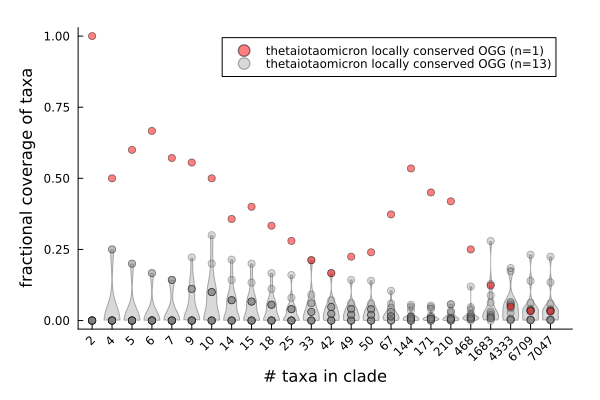

In [142]:
numcols = length(cladesizes)

plot(#title="'Motility' OGGs by tree depth",
    xticks=(1:numcols, string.(cladesizes)),
    xrotation=45,
    ylabel="fractional coverage of taxa",
    xlabel="# taxa in clade",
    margin=5Plots.Measures.mm,
    ylims=(0,1), widen=true,
)
violin!(permutedims(1:numcols), frac_present[.!islocallypresent, :], alpha=.3, c=:grey)
violin!(permutedims(1:numcols), frac_present[islocallypresent, :], alpha=.3, c=:pink)
# plot!(frac_present[islocallypresent, :]', c=:red, alpha=0.2)
# plot!(frac_present[.!islocallypresent, :]', c=:grey, alpha=0.2)
dotplot!(permutedims(1:numcols), frac_present[.!islocallypresent, :], c=:grey, alpha=.3, mode=:none,)
dotplot!(permutedims(1:numcols), frac_present[islocallypresent, :], c=:red, alpha=.5, mode=:none, )
scatter!([NaN NaN], label=["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))" "$(species_name) locally conserved OGG (n=$(sum(.!islocallypresent)))"], c=[:red :grey], alpha=[.5 0.3])
# scatter!([NaN], label=permutedims(["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))"]), c=[:red], alpha=[0.5])

In [143]:
savefig(joinpath(pdir, "$(species_name)_conservationbySPItree_withouttracelines.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/conserved_oggs_in_uniprot/thetaiotaomicron_conservationbySPItree_withouttracelines.pdf"

In [144]:
uniprot.var.description[indexin(chosen_oggs[islocallypresent], uniprot.var_names)]

1-element Vector{String}:
 "PFAM nucleic acid binding, OB-fold, tRNA"

In [145]:
uniprot.var.description[indexin(chosen_oggs[.!islocallypresent], uniprot.var_names)]

13-element Vector{String}:
 "competence protein COMEC"
 ""
 "Rhs element vgr protein"
 "type VI secretion protein"
 "Type VI secretion system, TssF"
 "type VI secretion protein"
 ""
 "protein tyrosine phosphatase activity"
 ""
 "Family of unknown function (DUF5458)"
 "PRTRC system protein B"
 "MTH538 TIR-like domain (DUF1863)"
 "Prokaryotic Ubiquitin"

In [158]:
ncbitaxaclades = vec(Matrix(unique(uniprot.obs[contains.(uniprot.obs.Species, species_name), [:Kingdom, :Phylum, :Class, :Order, :Family, :Genus, :Species]])))
ncbi_clades = [
    uniprot.obs.proteomeID[contains.(uniprot.obs.Species, ncbitaxaclades[7])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Genus, ncbitaxaclades[6])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Family, ncbitaxaclades[5])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Order, ncbitaxaclades[4])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Class, ncbitaxaclades[3])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Phylum, ncbitaxaclades[2])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Kingdom, ncbitaxaclades[1])],
]
cladesizes = length.(ncbi_clades)
ncbi_frac_present = map(ncbi_clades) do clade_ids
    cladeidx = indexin(clade_ids, uniprot.obs.proteomeID)
    mean(subset_ogg_mtx[cladeidx, :], dims=1) |> vec
end |> stack;

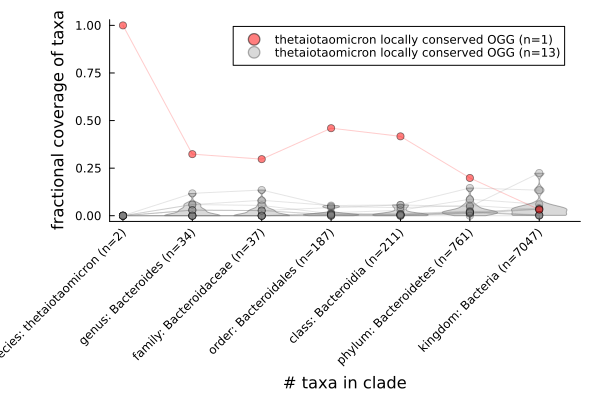

In [163]:
cladelabels = permutedims([
    "species: $(last(split(ncbitaxaclades[7], " "))) (n=$(cladesizes[1]))",
    "genus: $(ncbitaxaclades[6]) (n=$(cladesizes[2]))",
    "family: $(ncbitaxaclades[5]) (n=$(cladesizes[3]))",
    "order: $(ncbitaxaclades[4]) (n=$(cladesizes[4]))",
    "class: $(ncbitaxaclades[3]) (n=$(cladesizes[5]))",
    "phylum: $(ncbitaxaclades[2]) (n=$(cladesizes[6]))",
    "kingdom: $(ncbitaxaclades[1]) (n=$(cladesizes[7]))"
])

plot(#title="'Motility' OGGs by taxonic depth",
    xticks=(1:length(cladelabels), cladelabels),
    xrotation=45,
    ylabel="fractional coverage of taxa",
    xlabel="# taxa in clade",
    margin=3Plots.Measures.mm,
    leftmargin=13Plots.Measures.mm,
    bottommargin=13Plots.Measures.mm,
    ylims=(0,1), widen=true,
)
violin!(permutedims(1:length(cladelabels)), ncbi_frac_present[.!islocallypresent, :], alpha=.3, c=:grey)
violin!(permutedims(1:length(cladelabels)), ncbi_frac_present[islocallypresent, :], alpha=.3, c=:pink)
plot!(ncbi_frac_present[islocallypresent, :]', c=:red, alpha=0.2)
plot!(ncbi_frac_present[.!islocallypresent, :]', c=:grey, alpha=0.2)
dotplot!(permutedims(1:length(cladelabels)), ncbi_frac_present[.!islocallypresent, :], c=:grey, alpha=.3, mode=:none,)
dotplot!(permutedims(1:length(cladelabels)), ncbi_frac_present[islocallypresent, :], c=:red, alpha=.5, mode=:none,)
scatter!([NaN NaN], 
    label=["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))" "$(species_name) locally conserved OGG (n=$(sum(.!islocallypresent)))"],
    c=[:red :grey], 
    alpha=[.5 0.3],
)
# scatter!([NaN], label="locally conserved OGGs (n=10)", c=[:red], alpha=[0.5])

In [164]:
savefig(joinpath(pdir, "$(species_name)_conservationbyNCBItaxonomy_withtracelines.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/conserved_oggs_in_uniprot/thetaiotaomicron_conservationbyNCBItaxonomy_withtracelines.pdf"

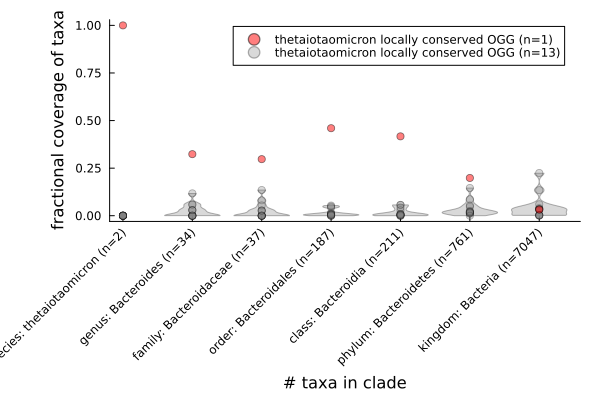

In [165]:
cladelabels = permutedims([
    "species: $(last(split(ncbitaxaclades[7], " "))) (n=$(cladesizes[1]))",
    "genus: $(ncbitaxaclades[6]) (n=$(cladesizes[2]))",
    "family: $(ncbitaxaclades[5]) (n=$(cladesizes[3]))",
    "order: $(ncbitaxaclades[4]) (n=$(cladesizes[4]))",
    "class: $(ncbitaxaclades[3]) (n=$(cladesizes[5]))",
    "phylum: $(ncbitaxaclades[2]) (n=$(cladesizes[6]))",
    "kingdom: $(ncbitaxaclades[1]) (n=$(cladesizes[7]))"
])

plot(#title="'Motility' OGGs by taxonic depth",
    xticks=(1:length(cladelabels), cladelabels),
    xrotation=45,
    ylabel="fractional coverage of taxa",
    xlabel="# taxa in clade",
    margin=3Plots.Measures.mm,
    leftmargin=13Plots.Measures.mm,
    bottommargin=13Plots.Measures.mm,
    ylims=(0,1), widen=true,
)
violin!(permutedims(1:length(cladelabels)), ncbi_frac_present[.!islocallypresent, :], alpha=.3, c=:grey)
violin!(permutedims(1:length(cladelabels)), ncbi_frac_present[islocallypresent, :], alpha=.3, c=:pink)
# plot!(ncbi_frac_present[islocallypresent, :]', c=:red, alpha=0.2)
# plot!(ncbi_frac_present[.!islocallypresent, :]', c=:grey, alpha=0.2)
dotplot!(permutedims(1:length(cladelabels)), ncbi_frac_present[.!islocallypresent, :], c=:grey, alpha=.3, mode=:none,)
dotplot!(permutedims(1:length(cladelabels)), ncbi_frac_present[islocallypresent, :], c=:red, alpha=.5, mode=:none,)
scatter!([NaN NaN], 
    label=["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))" "$(species_name) locally conserved OGG (n=$(sum(.!islocallypresent)))"],
    c=[:red :grey], 
    alpha=[.5 0.3],
)
# scatter!([NaN], label="locally conserved OGGs (n=10)", c=[:red], alpha=[0.5])

In [166]:
savefig(joinpath(pdir, "$(species_name)_conservationbyNCBItaxonomy_withouttracelines.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/conserved_oggs_in_uniprot/thetaiotaomicron_conservationbyNCBItaxonomy_withouttracelines.pdf"

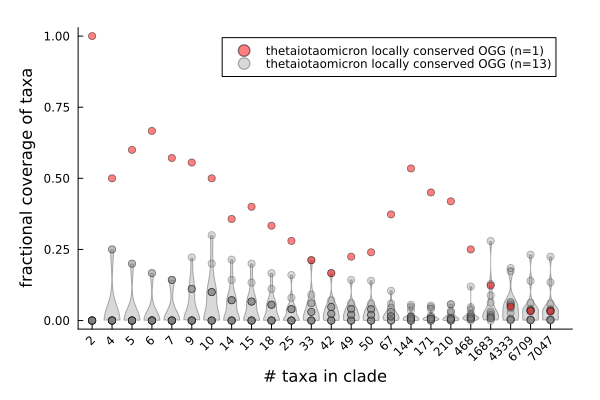

In [ ]:
numcols = length(cladesizes)

plot(#title="'Motility' OGGs by tree depth",
    xticks=(1:numcols, string.(cladesizes)),
    xrotation=45,
    ylabel="fractional coverage of taxa",
    xlabel="# taxa in clade",
    margin=5Plots.Measures.mm,
    ylims=(0,1), widen=true,
)
violin!(permutedims(1:numcols), frac_present[.!islocallypresent, :], alpha=.3, c=:grey)
violin!(permutedims(1:numcols), frac_present[islocallypresent, :], alpha=.3, c=:pink)
# plot!(frac_present[islocallypresent, :]', c=:red, alpha=0.2)
# plot!(frac_present[.!islocallypresent, :]', c=:grey, alpha=0.2)
dotplot!(permutedims(1:numcols), frac_present[.!islocallypresent, :], c=:grey, alpha=.3, mode=:none,)
dotplot!(permutedims(1:numcols), frac_present[islocallypresent, :], c=:red, alpha=.5, mode=:none, )
scatter!([NaN NaN], label=["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))" "$(species_name) locally conserved OGG (n=$(sum(.!islocallypresent)))"], c=[:red :grey], alpha=[.5 0.3])
# scatter!([NaN], label=permutedims(["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))"]), c=[:red], alpha=[0.5])

In [ ]:
savefig(joinpath(pdir, "$(species_name)_conservationbySPItree_withouttracelines.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/conserved_oggs_in_uniprot/thetaiotaomicron_conservationbySPItree_withouttracelines.pdf"

In [ ]:
uniprot.var.description[indexin(chosen_oggs[islocallypresent], uniprot.var_names)]

1-element Vector{String}:
 "PFAM nucleic acid binding, OB-fold, tRNA"

In [ ]:
uniprot.var.description[indexin(chosen_oggs[.!islocallypresent], uniprot.var_names)]

13-element Vector{String}:
 "competence protein COMEC"
 ""
 "Rhs element vgr protein"
 "type VI secretion protein"
 "Type VI secretion system, TssF"
 "type VI secretion protein"
 ""
 "protein tyrosine phosphatase activity"
 ""
 "Family of unknown function (DUF5458)"
 "PRTRC system protein B"
 "MTH538 TIR-like domain (DUF1863)"
 "Prokaryotic Ubiquitin"

In [ ]:
ncbitaxaclades = vec(Matrix(unique(uniprot.obs[contains.(uniprot.obs.Species, species_name), [:Kingdom, :Phylum, :Class, :Order, :Family, :Genus, :Species]])))
ncbi_clades = [
    uniprot.obs.proteomeID[contains.(uniprot.obs.Species, ncbitaxaclades[7])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Genus, ncbitaxaclades[6])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Family, ncbitaxaclades[5])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Order, ncbitaxaclades[4])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Class, ncbitaxaclades[3])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Phylum, ncbitaxaclades[2])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Kingdom, ncbitaxaclades[1])],
]
cladesizes = length.(ncbi_clades)
ncbi_frac_present = map(ncbi_clades) do clade_ids
    cladeidx = indexin(clade_ids, uniprot.obs.proteomeID)
    mean(subset_ogg_mtx[cladeidx, :], dims=1) |> vec
end |> stack;

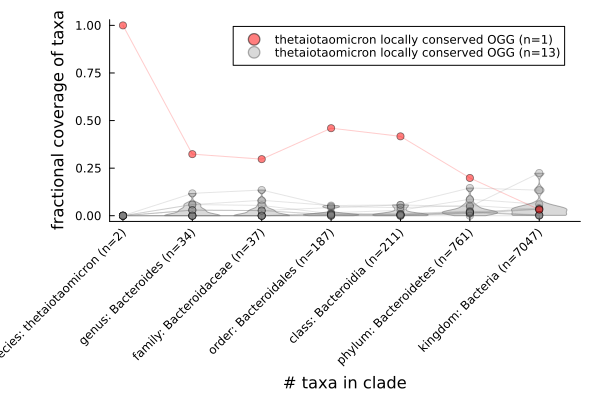

In [ ]:
cladelabels = permutedims([
    "species: $(last(split(ncbitaxaclades[7], " "))) (n=$(cladesizes[1]))",
    "genus: $(ncbitaxaclades[6]) (n=$(cladesizes[2]))",
    "family: $(ncbitaxaclades[5]) (n=$(cladesizes[3]))",
    "order: $(ncbitaxaclades[4]) (n=$(cladesizes[4]))",
    "class: $(ncbitaxaclades[3]) (n=$(cladesizes[5]))",
    "phylum: $(ncbitaxaclades[2]) (n=$(cladesizes[6]))",
    "kingdom: $(ncbitaxaclades[1]) (n=$(cladesizes[7]))"
])

plot(#title="'Motility' OGGs by taxonic depth",
    xticks=(1:length(cladelabels), cladelabels),
    xrotation=45,
    ylabel="fractional coverage of taxa",
    xlabel="# taxa in clade",
    margin=3Plots.Measures.mm,
    leftmargin=13Plots.Measures.mm,
    bottommargin=13Plots.Measures.mm,
    ylims=(0,1), widen=true,
)
violin!(permutedims(1:length(cladelabels)), ncbi_frac_present[.!islocallypresent, :], alpha=.3, c=:grey)
violin!(permutedims(1:length(cladelabels)), ncbi_frac_present[islocallypresent, :], alpha=.3, c=:pink)
plot!(ncbi_frac_present[islocallypresent, :]', c=:red, alpha=0.2)
plot!(ncbi_frac_present[.!islocallypresent, :]', c=:grey, alpha=0.2)
dotplot!(permutedims(1:length(cladelabels)), ncbi_frac_present[.!islocallypresent, :], c=:grey, alpha=.3, mode=:none,)
dotplot!(permutedims(1:length(cladelabels)), ncbi_frac_present[islocallypresent, :], c=:red, alpha=.5, mode=:none,)
scatter!([NaN NaN], 
    label=["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))" "$(species_name) locally conserved OGG (n=$(sum(.!islocallypresent)))"],
    c=[:red :grey], 
    alpha=[.5 0.3],
)
# scatter!([NaN], label="locally conserved OGGs (n=10)", c=[:red], alpha=[0.5])

In [ ]:
savefig(joinpath(pdir, "$(species_name)_conservationbyNCBItaxonomy_withtracelines.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/conserved_oggs_in_uniprot/thetaiotaomicron_conservationbyNCBItaxonomy_withtracelines.pdf"

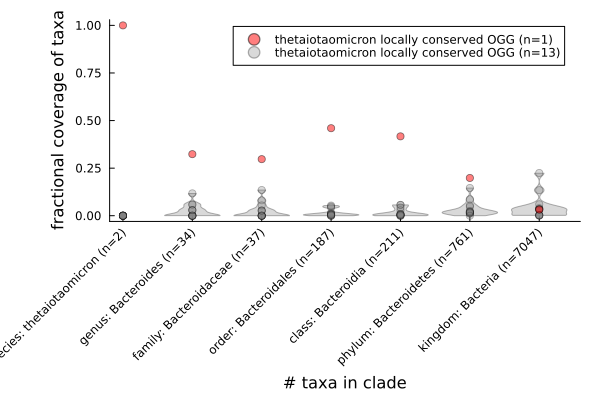

In [ ]:
cladelabels = permutedims([
    "species: $(last(split(ncbitaxaclades[7], " "))) (n=$(cladesizes[1]))",
    "genus: $(ncbitaxaclades[6]) (n=$(cladesizes[2]))",
    "family: $(ncbitaxaclades[5]) (n=$(cladesizes[3]))",
    "order: $(ncbitaxaclades[4]) (n=$(cladesizes[4]))",
    "class: $(ncbitaxaclades[3]) (n=$(cladesizes[5]))",
    "phylum: $(ncbitaxaclades[2]) (n=$(cladesizes[6]))",
    "kingdom: $(ncbitaxaclades[1]) (n=$(cladesizes[7]))"
])

plot(#title="'Motility' OGGs by taxonic depth",
    xticks=(1:length(cladelabels), cladelabels),
    xrotation=45,
    ylabel="fractional coverage of taxa",
    xlabel="# taxa in clade",
    margin=3Plots.Measures.mm,
    leftmargin=13Plots.Measures.mm,
    bottommargin=13Plots.Measures.mm,
    ylims=(0,1), widen=true,
)
violin!(permutedims(1:length(cladelabels)), ncbi_frac_present[.!islocallypresent, :], alpha=.3, c=:grey)
violin!(permutedims(1:length(cladelabels)), ncbi_frac_present[islocallypresent, :], alpha=.3, c=:pink)
# plot!(ncbi_frac_present[islocallypresent, :]', c=:red, alpha=0.2)
# plot!(ncbi_frac_present[.!islocallypresent, :]', c=:grey, alpha=0.2)
dotplot!(permutedims(1:length(cladelabels)), ncbi_frac_present[.!islocallypresent, :], c=:grey, alpha=.3, mode=:none,)
dotplot!(permutedims(1:length(cladelabels)), ncbi_frac_present[islocallypresent, :], c=:red, alpha=.5, mode=:none,)
scatter!([NaN NaN], 
    label=["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))" "$(species_name) locally conserved OGG (n=$(sum(.!islocallypresent)))"],
    c=[:red :grey], 
    alpha=[.5 0.3],
)
# scatter!([NaN], label="locally conserved OGGs (n=10)", c=[:red], alpha=[0.5])

In [ ]:
savefig(joinpath(pdir, "$(species_name)_conservationbyNCBItaxonomy_withouttracelines.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/conserved_oggs_in_uniprot/thetaiotaomicron_conservationbyNCBItaxonomy_withouttracelines.pdf"

# Thetaiotaomicron phage

In [167]:
treeorder = indexin(getleafnames(uptree), uniprot.obs_names);
species_name = "thetaiotaomicron"
chosen_oggs = [
    "COG0270",
    "COG0338",
    "COG0550",
    "COG0654",
    "COG1432",
    "COG1895",
    "COG2301",
    "COG3645",
    "COG3772",
    "COG3843",
    "COG4938",
    "2Z7X2",
    "2Z86V",
    "2ZS2M",
    "309XW",
];
chosen_oggs_idx = indexin(chosen_oggs, uniprot.var_names);
subset_ogg_mtx = upmtx[:, chosen_oggs_idx] .> 1;

foundtaxa = uniprot.obs[contains.(uniprot.obs.Species, species_name), [:Kingdom, :Phylum, :Class, :Order, :Family, :Genus, :Species]]

@info "string: '$(species_name)' finds $(nrow(foundtaxa)) taxa:\n$(foundtaxa)"

species_node_idx = findall(contains.(uniprot.obs.Species[treeorder], species_name))[1]
speciesnode = leafnodes[species_node_idx]
depthofspecies = network_distance(uptree, speciesnode)
speciesparents = []
node = speciesnode
for i in 1:depthofspecies
    node = parent(node)
    push!(speciesparents, node)
end

cladesizes = length.(getleafnames.(speciesparents))
@info "# of taxa per clade = $(cladesizes)"

cladesateachtreelevel = getleafnames.(speciesparents);
frac_present = map(cladesateachtreelevel) do clade_ids
    cladeidx = indexin(clade_ids, uniprot.obs_names)
    mean(subset_ogg_mtx[cladeidx, :], dims=1) |> vec
end |> stack
islocallypresent = frac_present[:, 1] .== 1;

@info "# locally present = $(sum(islocallypresent)), # not locally present = $(sum(.!islocallypresent))"

┌ Info: string: 'thetaiotaomicron' finds 2 taxa:
│ 2×7 DataFrame
│  Row │ Kingdom   Phylum         Class        Order          Family          Genus        Species
│      │ String    String         String       String         String          String       String
│ ─────┼────────────────────────────────────────────────────────────────────────────────────────────────────────────────
│    1 │ Bacteria  Bacteroidetes  Bacteroidia  Bacteroidales  Bacteroidaceae  Bacteroides  Bacteroides thetaiotaomicron
│    2 │ Bacteria  Bacteroidetes  Bacteroidia  Bacteroidales  Bacteroidaceae  Bacteroides  Bacteroides thetaiotaomicron
└ @ Main /Users/ben/projects/Doran_etal_2022/notebooks/reports/16_uniprot_conservation_of_motility.ipynb:25
┌ Info: # of taxa per clade = [2, 4, 5, 6, 7, 9, 10, 14, 15, 18, 25, 33, 42, 49, 50, 67, 144, 171, 210, 468, 1683, 4333, 6709, 7047]
└ @ Main /Users/ben/projects/Doran_etal_2022/notebooks/reports/16_uniprot_conservation_of_motility.ipynb:38


┌ Info: # locally present = 2, # not locally present = 13
└ @ Main /Users/ben/projects/Doran_etal_2022/notebooks/reports/16_uniprot_conservation_of_motility.ipynb:47


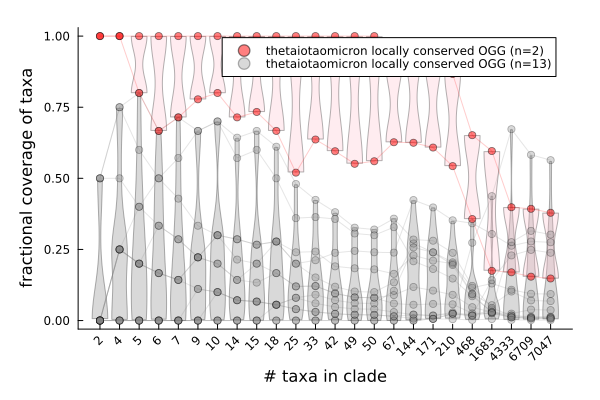

In [168]:
numcols = length(cladesizes)

plot(#title="'Motility' OGGs by tree depth",
    xticks=(1:numcols, string.(cladesizes)),
    xrotation=45,
    ylabel="fractional coverage of taxa",
    xlabel="# taxa in clade",
    margin=5Plots.Measures.mm,
    ylims=(0,1), widen=true,
)
violin!(permutedims(1:numcols), frac_present[.!islocallypresent, :], alpha=.3, c=:grey)
violin!(permutedims(1:numcols), frac_present[islocallypresent, :], alpha=.3, c=:pink)
plot!(frac_present[islocallypresent, :]', c=:red, alpha=0.2)
plot!(frac_present[.!islocallypresent, :]', c=:grey, alpha=0.2)
dotplot!(permutedims(1:numcols), frac_present[.!islocallypresent, :], c=:grey, alpha=.3, mode=:none,)
dotplot!(permutedims(1:numcols), frac_present[islocallypresent, :], c=:red, alpha=.5, mode=:none, )
scatter!([NaN NaN], label=["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))" "$(species_name) locally conserved OGG (n=$(sum(.!islocallypresent)))"], c=[:red :grey], alpha=[.5 0.3])
# scatter!([NaN], label=permutedims(["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))"]), c=[:red], alpha=[0.5])

In [ ]:
savefig(joinpath(pdir, "$(species_name)_conservationbySPItree_withtracelines.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/conserved_oggs_in_uniprot/thetaiotaomicron_conservationbySPItree_withtracelines.pdf"

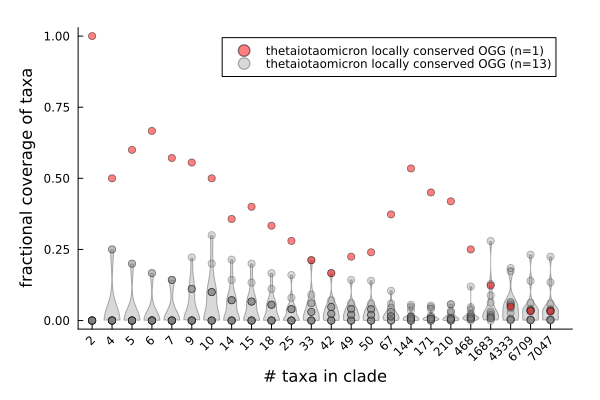

In [ ]:
numcols = length(cladesizes)

plot(#title="'Motility' OGGs by tree depth",
    xticks=(1:numcols, string.(cladesizes)),
    xrotation=45,
    ylabel="fractional coverage of taxa",
    xlabel="# taxa in clade",
    margin=5Plots.Measures.mm,
    ylims=(0,1), widen=true,
)
violin!(permutedims(1:numcols), frac_present[.!islocallypresent, :], alpha=.3, c=:grey)
violin!(permutedims(1:numcols), frac_present[islocallypresent, :], alpha=.3, c=:pink)
# plot!(frac_present[islocallypresent, :]', c=:red, alpha=0.2)
# plot!(frac_present[.!islocallypresent, :]', c=:grey, alpha=0.2)
dotplot!(permutedims(1:numcols), frac_present[.!islocallypresent, :], c=:grey, alpha=.3, mode=:none,)
dotplot!(permutedims(1:numcols), frac_present[islocallypresent, :], c=:red, alpha=.5, mode=:none, )
scatter!([NaN NaN], label=["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))" "$(species_name) locally conserved OGG (n=$(sum(.!islocallypresent)))"], c=[:red :grey], alpha=[.5 0.3])
# scatter!([NaN], label=permutedims(["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))"]), c=[:red], alpha=[0.5])

In [ ]:
savefig(joinpath(pdir, "$(species_name)_conservationbySPItree_withouttracelines.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/conserved_oggs_in_uniprot/thetaiotaomicron_conservationbySPItree_withouttracelines.pdf"

In [ ]:
uniprot.var.description[indexin(chosen_oggs[islocallypresent], uniprot.var_names)]

1-element Vector{String}:
 "PFAM nucleic acid binding, OB-fold, tRNA"

In [ ]:
uniprot.var.description[indexin(chosen_oggs[.!islocallypresent], uniprot.var_names)]

13-element Vector{String}:
 "competence protein COMEC"
 ""
 "Rhs element vgr protein"
 "type VI secretion protein"
 "Type VI secretion system, TssF"
 "type VI secretion protein"
 ""
 "protein tyrosine phosphatase activity"
 ""
 "Family of unknown function (DUF5458)"
 "PRTRC system protein B"
 "MTH538 TIR-like domain (DUF1863)"
 "Prokaryotic Ubiquitin"

In [ ]:
ncbitaxaclades = vec(Matrix(unique(uniprot.obs[contains.(uniprot.obs.Species, species_name), [:Kingdom, :Phylum, :Class, :Order, :Family, :Genus, :Species]])))
ncbi_clades = [
    uniprot.obs.proteomeID[contains.(uniprot.obs.Species, ncbitaxaclades[7])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Genus, ncbitaxaclades[6])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Family, ncbitaxaclades[5])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Order, ncbitaxaclades[4])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Class, ncbitaxaclades[3])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Phylum, ncbitaxaclades[2])],
    uniprot.obs.proteomeID[contains.(uniprot.obs.Kingdom, ncbitaxaclades[1])],
]
cladesizes = length.(ncbi_clades)
ncbi_frac_present = map(ncbi_clades) do clade_ids
    cladeidx = indexin(clade_ids, uniprot.obs.proteomeID)
    mean(subset_ogg_mtx[cladeidx, :], dims=1) |> vec
end |> stack;

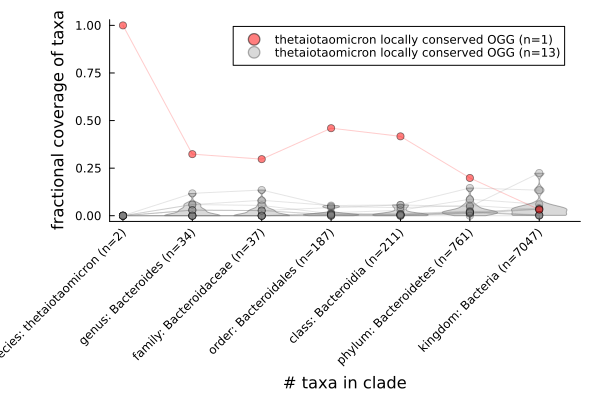

In [ ]:
cladelabels = permutedims([
    "species: $(last(split(ncbitaxaclades[7], " "))) (n=$(cladesizes[1]))",
    "genus: $(ncbitaxaclades[6]) (n=$(cladesizes[2]))",
    "family: $(ncbitaxaclades[5]) (n=$(cladesizes[3]))",
    "order: $(ncbitaxaclades[4]) (n=$(cladesizes[4]))",
    "class: $(ncbitaxaclades[3]) (n=$(cladesizes[5]))",
    "phylum: $(ncbitaxaclades[2]) (n=$(cladesizes[6]))",
    "kingdom: $(ncbitaxaclades[1]) (n=$(cladesizes[7]))"
])

plot(#title="'Motility' OGGs by taxonic depth",
    xticks=(1:length(cladelabels), cladelabels),
    xrotation=45,
    ylabel="fractional coverage of taxa",
    xlabel="# taxa in clade",
    margin=3Plots.Measures.mm,
    leftmargin=13Plots.Measures.mm,
    bottommargin=13Plots.Measures.mm,
    ylims=(0,1), widen=true,
)
violin!(permutedims(1:length(cladelabels)), ncbi_frac_present[.!islocallypresent, :], alpha=.3, c=:grey)
violin!(permutedims(1:length(cladelabels)), ncbi_frac_present[islocallypresent, :], alpha=.3, c=:pink)
plot!(ncbi_frac_present[islocallypresent, :]', c=:red, alpha=0.2)
plot!(ncbi_frac_present[.!islocallypresent, :]', c=:grey, alpha=0.2)
dotplot!(permutedims(1:length(cladelabels)), ncbi_frac_present[.!islocallypresent, :], c=:grey, alpha=.3, mode=:none,)
dotplot!(permutedims(1:length(cladelabels)), ncbi_frac_present[islocallypresent, :], c=:red, alpha=.5, mode=:none,)
scatter!([NaN NaN], 
    label=["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))" "$(species_name) locally conserved OGG (n=$(sum(.!islocallypresent)))"],
    c=[:red :grey], 
    alpha=[.5 0.3],
)
# scatter!([NaN], label="locally conserved OGGs (n=10)", c=[:red], alpha=[0.5])

In [ ]:
savefig(joinpath(pdir, "$(species_name)_conservationbyNCBItaxonomy_withtracelines.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/conserved_oggs_in_uniprot/thetaiotaomicron_conservationbyNCBItaxonomy_withtracelines.pdf"

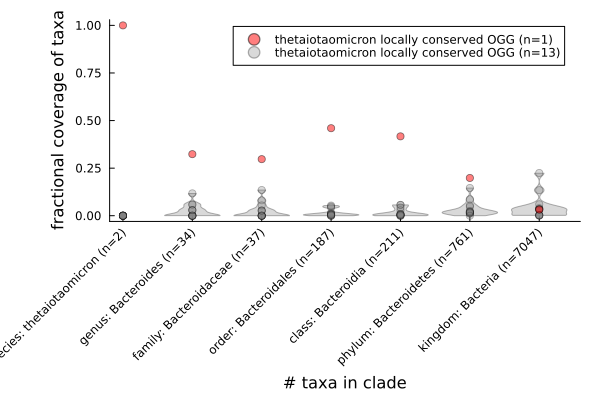

In [ ]:
cladelabels = permutedims([
    "species: $(last(split(ncbitaxaclades[7], " "))) (n=$(cladesizes[1]))",
    "genus: $(ncbitaxaclades[6]) (n=$(cladesizes[2]))",
    "family: $(ncbitaxaclades[5]) (n=$(cladesizes[3]))",
    "order: $(ncbitaxaclades[4]) (n=$(cladesizes[4]))",
    "class: $(ncbitaxaclades[3]) (n=$(cladesizes[5]))",
    "phylum: $(ncbitaxaclades[2]) (n=$(cladesizes[6]))",
    "kingdom: $(ncbitaxaclades[1]) (n=$(cladesizes[7]))"
])

plot(#title="'Motility' OGGs by taxonic depth",
    xticks=(1:length(cladelabels), cladelabels),
    xrotation=45,
    ylabel="fractional coverage of taxa",
    xlabel="# taxa in clade",
    margin=3Plots.Measures.mm,
    leftmargin=13Plots.Measures.mm,
    bottommargin=13Plots.Measures.mm,
    ylims=(0,1), widen=true,
)
violin!(permutedims(1:length(cladelabels)), ncbi_frac_present[.!islocallypresent, :], alpha=.3, c=:grey)
violin!(permutedims(1:length(cladelabels)), ncbi_frac_present[islocallypresent, :], alpha=.3, c=:pink)
# plot!(ncbi_frac_present[islocallypresent, :]', c=:red, alpha=0.2)
# plot!(ncbi_frac_present[.!islocallypresent, :]', c=:grey, alpha=0.2)
dotplot!(permutedims(1:length(cladelabels)), ncbi_frac_present[.!islocallypresent, :], c=:grey, alpha=.3, mode=:none,)
dotplot!(permutedims(1:length(cladelabels)), ncbi_frac_present[islocallypresent, :], c=:red, alpha=.5, mode=:none,)
scatter!([NaN NaN], 
    label=["$(species_name) locally conserved OGG (n=$(sum(islocallypresent)))" "$(species_name) locally conserved OGG (n=$(sum(.!islocallypresent)))"],
    c=[:red :grey], 
    alpha=[.5 0.3],
)
# scatter!([NaN], label="locally conserved OGGs (n=10)", c=[:red], alpha=[0.5])

In [ ]:
savefig(joinpath(pdir, "$(species_name)_conservationbyNCBItaxonomy_withouttracelines.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/conserved_oggs_in_uniprot/thetaiotaomicron_conservationbyNCBItaxonomy_withouttracelines.pdf"

# fractional coverage at uniprot level

In [8]:
UP_fractionalcoverage = vec(mean(upmtx .> 0., dims=1));

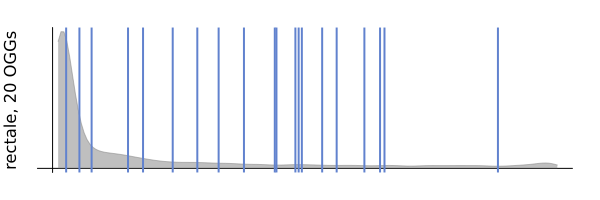

In [45]:
species_name = "rectale"
chosen_oggs = [ 
    "COG0835", "COG0842", "COG1345", "COG1344", "COG1442",
    "COG1516", "COG1776", "COG2186", "COG2198", "COG2405", 
    "COG2865", "COG2944", "COG3210", "COG3316", "COG3547", 
    "COG4495", "COG4786", "COG5001", "COG5279", "COG5444",
];
chosen_oggs_idx = indexin(chosen_oggs, uniprot.var_names);

plot(#title="$(species_name), $(length(chosen_oggs)) annotated OGGs",
    ylabel="$(species_name), $(length(chosen_oggs)) OGGs",
    # xlabel="fractional coverage", 
    framestyle=:zerolines,
    yticks=:none,
    size=(600, 200),
    margin=5Plots.Measures.mm,
    xticks=:none,
)
density!(UP_fractionalcoverage, c=:grey, alpha=.5, fill=0, trim=true)
rectaleplot = vline!(UP_fractionalcoverage[chosen_oggs_idx], c="#6182ce", lw=2)

In [46]:
# savefig(joinpath(pdir, "$(species_name)_fractionalcoverage_density-full-uniprot_lines-$(length(chosen_oggs))-annotated-oggs.pdf"))

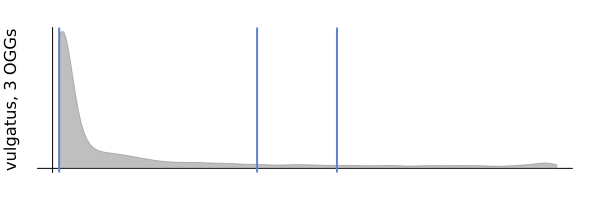

In [47]:
species_name = "vulgatus"
chosen_oggs = [
    "COG0863",
    "COG1083",
    "COG4744",
];
chosen_oggs_idx = indexin(chosen_oggs, uniprot.var_names);

plot(#title="$(species_name), $(length(chosen_oggs)) annotated OGGs",
    ylabel="$(species_name), $(length(chosen_oggs)) OGGs",
    # xlabel="fractional coverage", 
    framestyle=:zerolines,
    yticks=:none,
    size=(600, 200),
    margin=5Plots.Measures.mm,
    xticks=:none,
)
density!(UP_fractionalcoverage, c=:grey, alpha=.5, fill=0, trim=true)
vulgatusplot1 = vline!(UP_fractionalcoverage[chosen_oggs_idx], c="#6182ce", lw=2)


species_name = "vulgatus"
chosen_oggs = [
    "32ZV1",
];
chosen_oggs_idx = indexin(chosen_oggs, uniprot.var_names);

plot(#title="$(species_name), $(length(chosen_oggs)) annotated OGGs",
    ylabel="$(species_name), $(length(chosen_oggs)) OGGs",
    # xlabel="fractional coverage", 
    framestyle=:zerolines,
    yticks=:none,
    size=(600, 200),
    margin=5Plots.Measures.mm,
    xticks=:none,
)
density!(UP_fractionalcoverage, c=:grey, alpha=.5, fill=0, trim=true)
vulgatusplot2 = vline!(UP_fractionalcoverage[chosen_oggs_idx], c="#6182ce", lw=2)


species_name = "vulgatus"
chosen_oggs = [
    "COG0666",
    "COG2214",
    "2Z8QV",
];
chosen_oggs_idx = indexin(chosen_oggs, uniprot.var_names);

plot(#title="$(species_name), $(length(chosen_oggs)) annotated OGGs",
    ylabel="$(species_name), $(length(chosen_oggs)) OGGs",
    # xlabel="fractional coverage", 
    framestyle=:zerolines,
    yticks=:none,
    size=(600, 200),
    margin=5Plots.Measures.mm,
    xticks=:none,
)
density!(UP_fractionalcoverage, c=:grey, alpha=.5, fill=0, trim=true)
vulgatusplot3 = vline!(UP_fractionalcoverage[chosen_oggs_idx], c="#6182ce", lw=2)

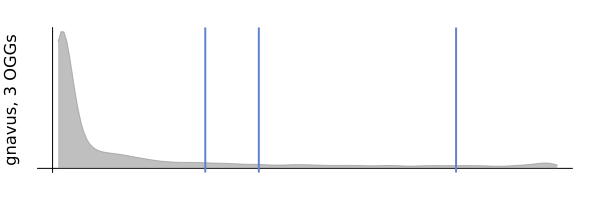

In [48]:
species_name = "gnavus"
chosen_oggs = [
    "COG1440",
    "COG1447",
];
chosen_oggs_idx = indexin(chosen_oggs, uniprot.var_names);

plot(#title="$(species_name), $(length(chosen_oggs)) annotated OGGs",
    ylabel="$(species_name), $(length(chosen_oggs)) OGGs",
    # xlabel="fractional coverage", 
    framestyle=:zerolines,
    yticks=:none,
    size=(600, 200),
    margin=5Plots.Measures.mm,
    xticks=:none,
)
density!(UP_fractionalcoverage, c=:grey, alpha=.5, fill=0, trim=true)
gnavusplot1 = vline!(UP_fractionalcoverage[chosen_oggs_idx], c="#6182ce", lw=2)

species_name = "gnavus"
chosen_oggs = [
    "COG1694",
];
chosen_oggs_idx = indexin(chosen_oggs, uniprot.var_names);

plot(#title="$(species_name), $(length(chosen_oggs)) annotated OGGs",
    ylabel="$(species_name), $(length(chosen_oggs)) OGGs",
    # xlabel="fractional coverage", 
    framestyle=:zerolines,
    yticks=:none,
    size=(600, 200),
    margin=5Plots.Measures.mm,
    xticks=:none,
)
density!(UP_fractionalcoverage, c=:grey, alpha=.5, fill=0, trim=true)
gnavusplot2 = vline!(UP_fractionalcoverage[chosen_oggs_idx], c="#6182ce", lw=2)

species_name = "gnavus"
chosen_oggs = [
    "COG0531",
    "COG1501",
    "COG2222",
];
chosen_oggs_idx = indexin(chosen_oggs, uniprot.var_names);

plot(#title="$(species_name), $(length(chosen_oggs)) annotated OGGs",
    ylabel="$(species_name), $(length(chosen_oggs)) OGGs",
    # xlabel="fractional coverage", 
    framestyle=:zerolines,
    yticks=:none,
    size=(600, 200),
    margin=5Plots.Measures.mm,
    xticks=:none,
)
density!(UP_fractionalcoverage, c=:grey, alpha=.5, fill=0, trim=true)
gnavusplot3 = vline!(UP_fractionalcoverage[chosen_oggs_idx], c="#6182ce", lw=2)

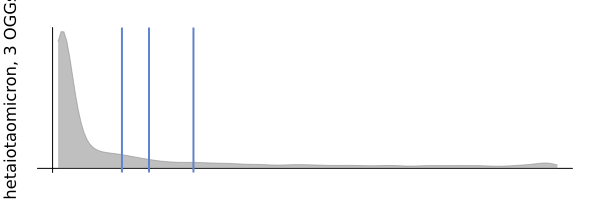

In [49]:
species_name = "thetaiotaomicron"
chosen_oggs = [
    "COG1474",
    "COG2942",
    "COG3410",
];
chosen_oggs_idx = indexin(chosen_oggs, uniprot.var_names);

plot(#title="$(species_name), $(length(chosen_oggs)) annotated OGGs",
    ylabel="$(species_name), $(length(chosen_oggs)) OGGs",
    # xlabel="fractional coverage", 
    framestyle=:zerolines,
    yticks=:none,
    size=(600, 200),
    margin=5Plots.Measures.mm,
    xticks=:none,
)
density!(UP_fractionalcoverage, c=:grey, alpha=.5, fill=0, trim=true)
thetaiotaomicronplot = vline!(UP_fractionalcoverage[chosen_oggs_idx], c="#6182ce", lw=2)

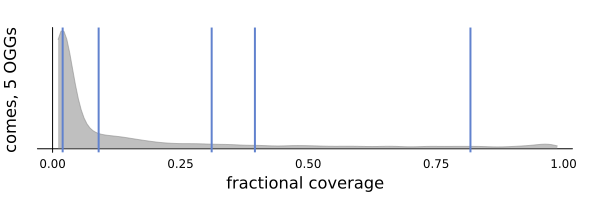

In [50]:
species_name = "comes"
chosen_oggs = [
    "COG0145",
    "COG1011",
    "COG1351",
    "COG4951",
    "2Z81G",
];
chosen_oggs_idx = indexin(chosen_oggs, uniprot.var_names);

plot(#title="$(species_name)",
    ylabel="$(species_name), $(length(chosen_oggs)) OGGs",
    xlabel="fractional coverage", 
    framestyle=:zerolines,
    yticks=:none,
    size=(600, 200),
    margin=5Plots.Measures.mm,
)
density!(UP_fractionalcoverage, c=:grey, alpha=.5, fill=0, trim=true)
comesplot = vline!(UP_fractionalcoverage[chosen_oggs_idx], c="#6182ce", lw=2)

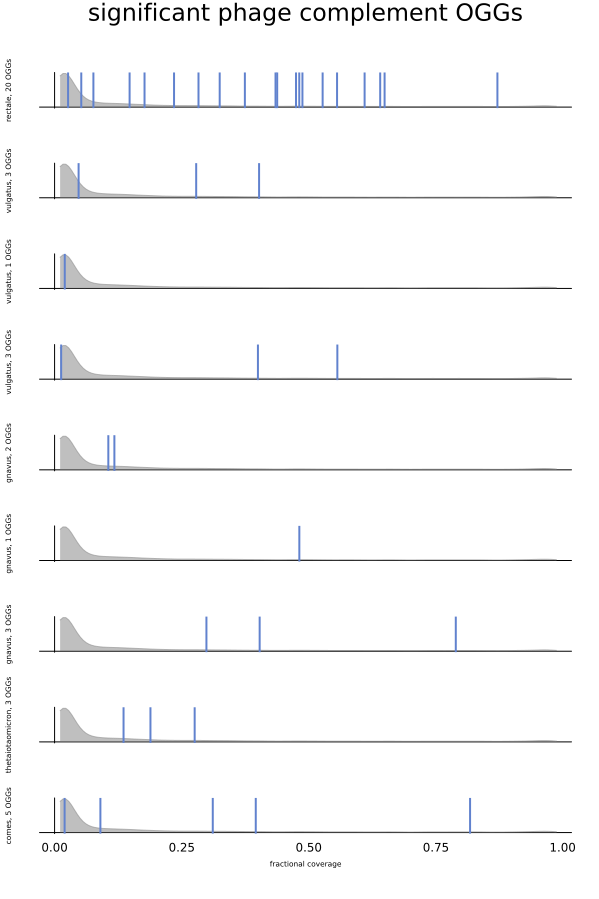

In [51]:
# layout = @layout [a; b; c; d; e]
# Plots.scalefontsizes(.5)
plot(
    plot_title="significant phage complement OGGs",
    rectaleplot,
    vulgatusplot1,vulgatusplot2,vulgatusplot3,  
    gnavusplot1,gnavusplot2,gnavusplot3,
    thetaiotaomicronplot, 
    comesplot, 
    layout=grid(9,1), 
    size=(600,900),
    labelfontsize=5,
)
# Plots.scalefontsizes()

## more local fractional coverage

In [9]:
bupmtx = upmtx .> 0;

In [114]:
treeorder = indexin(getleafnames(uptree), uniprot.obs_names);

species_names = [
    "rectale",

    "gnavus",
    "gnavus",
    "gnavus",

    "comes",

    "vulgatus",
    "vulgatus",
    "vulgatus",

    "thetaiotaomicron",
]
chosen_oggss = [
    ["COG0835", "COG0842", "COG1345", "COG1344", "COG1442",
    "COG1516", "COG1776", "COG2186", "COG2198", "COG2405", 
    "COG2865", "COG2944", "COG3210", "COG3316", "COG3547", 
    "COG4495", "COG4786", "COG5001", "COG5279", "COG5444",],

    ["COG1440","COG1447",],
    ["COG1694",],
    ["COG0531","COG1501","COG2222",],

    ["COG0145","COG1011","COG1351","COG4951","2Z81G",],

    ["COG0863","COG1083","COG4744",],
    ["32ZV1",],
    ["COG0666","COG2214","2Z8QV",],

    ["COG1474","COG2942","COG3410",],
];

level = 3

ps = []

for (i, (species_name, chosen_oggs)) in enumerate(zip(species_names, chosen_oggss))
# (species_name, chosen_oggs) =  first(zip(species_names, chosen_oggss))
    chosen_oggs_idx = indexin(chosen_oggs, uniprot.var_names);

    foundtaxa = uniprot.obs[contains.(uniprot.obs.Species, species_name), [:Kingdom, :Phylum, :Class, :Order, :Family, :Genus, :Species]]
    species_node_idx = findall(contains.(uniprot.obs.Species[treeorder], species_name))[1]
    speciesnode = leafnodes[species_node_idx]
    depthofspecies = network_distance(uptree, speciesnode)
    speciesparents = []
    node = speciesnode
    for i in 1:depthofspecies
        node = parent(node)
        push!(speciesparents, node)
    end

    cladesizes = length.(getleafnames.(speciesparents))

    cladesateachtreelevel = getleafnames.(speciesparents);
    frac_present = map(cladesateachtreelevel) do clade_ids
        cladeidx = indexin(clade_ids, uniprot.obs_names)
        mean(bupmtx[cladeidx, :], dims=1) |> vec
    end |> stack
    islocallypresent = frac_present[:, 1] .== 1;


    p = plot(
        ylabel="$(species_name)\n$(length(chosen_oggs)) OGGs\n$(cladesizes[level]) taxa",
        xlabel= i==9 ? "fractional coverage" : "", 
        framestyle=:zerolines,
        yticks=:none,
        xticks= i==9 ? :auto : :none,
        # size=(600, 200),
        margin=5Plots.Measures.mm,
    )
    density!(frac_present[:, level], c=:grey, alpha=.5, fill=0, trim=true)
    vline!(frac_present[chosen_oggs_idx, level], c="#6182ce", lw=2)
    push!(ps, p)
end

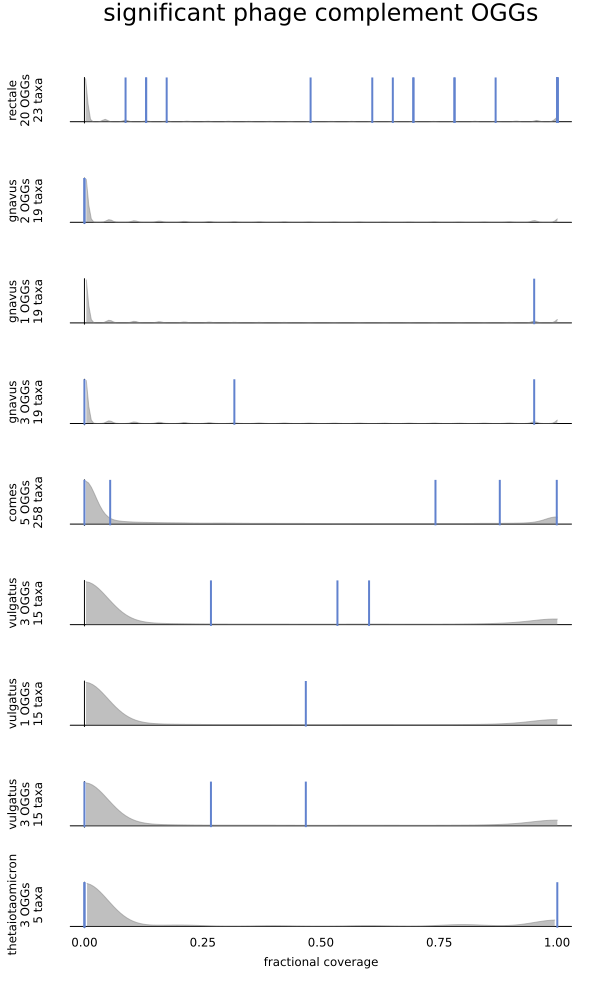

In [115]:
plot(ps..., layout=grid(length(ps), 1), labelfontsize=8, size=(600,1000), plot_title="significant phage complement OGGs",)

In [116]:
treeorder = indexin(getleafnames(uptree), uniprot.obs_names);

species_names = [
    "rectale",

    "gnavus",
    "gnavus",
    "gnavus",

    "comes",

    "vulgatus",
    "vulgatus",
    "vulgatus",

    "thetaiotaomicron",
]
chosen_oggss = [
    ["COG0835", "COG0842", "COG1345", "COG1344", "COG1442",
    "COG1516", "COG1776", "COG2186", "COG2198", "COG2405", 
    "COG2865", "COG2944", "COG3210", "COG3316", "COG3547", 
    "COG4495", "COG4786", "COG5001", "COG5279", "COG5444",],

    ["COG1440","COG1447",],
    ["COG1694",],
    ["COG0531","COG1501","COG2222",],

    ["COG0145","COG1011","COG1351","COG4951","2Z81G",],

    ["COG0863","COG1083","COG4744",],
    ["32ZV1",],
    ["COG0666","COG2214","2Z8QV",],

    ["COG1474","COG2942","COG3410",],
];

# level = 3

ps = []

for (i, (species_name, chosen_oggs)) in enumerate(zip(species_names, chosen_oggss))
# (species_name, chosen_oggs) =  first(zip(species_names, chosen_oggss))
    chosen_oggs_idx = indexin(chosen_oggs, uniprot.var_names);

    foundtaxa = uniprot.obs[contains.(uniprot.obs.Species, species_name), [:Kingdom, :Phylum, :Class, :Order, :Family, :Genus, :Species]]
    species_node_idx = findall(contains.(uniprot.obs.Species[treeorder], species_name))[1]
    speciesnode = leafnodes[species_node_idx]
    depthofspecies = network_distance(uptree, speciesnode)
    speciesparents = []
    node = speciesnode
    for i in 1:depthofspecies
        node = parent(node)
        push!(speciesparents, node)
    end

    cladesizes = length.(getleafnames.(speciesparents))

    cladesateachtreelevel = getleafnames.(speciesparents);
    frac_present = map(cladesateachtreelevel) do clade_ids
        cladeidx = indexin(clade_ids, uniprot.obs_names)
        mean(bupmtx[cladeidx, :], dims=1) |> vec
    end |> stack
    islocallypresent = frac_present[:, 1] .== 1;


    p = plot(
        ylabel="$(species_name)\n$(length(chosen_oggs)) OGGs\n$(cladesizes[end]) taxa",
        xlabel= i==9 ? "fractional coverage" : "", 
        framestyle=:zerolines,
        yticks=:none,
        xticks= i==9 ? :auto : :none,
        # size=(600, 200),
        margin=5Plots.Measures.mm,
    )
    density!(frac_present[:, end], c=:grey, alpha=.5, fill=0, trim=true)
    vline!(frac_present[chosen_oggs_idx, end], c="#6182ce", lw=2)
    push!(ps, p)
end

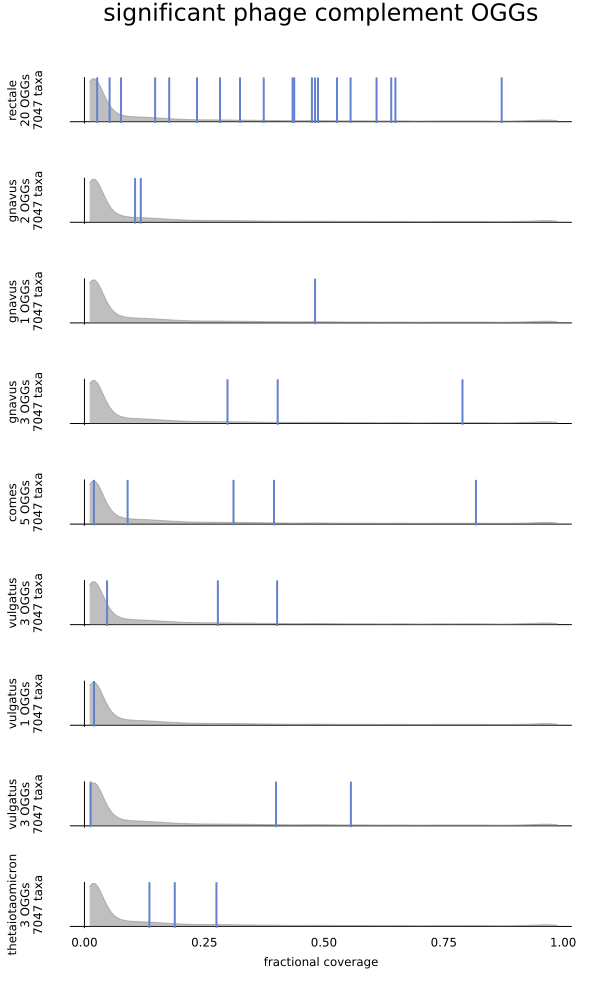

In [117]:
plot(ps..., layout=grid(length(ps), 1), labelfontsize=8, size=(600,1000), plot_title="significant phage complement OGGs",)

In [40]:
treeorder = indexin(getleafnames(uptree), uniprot.obs_names);

species_names = [
    "rectale",

    "gnavus",

    "comes",

    "vulgatus",

    "thetaiotaomicron",
]
chosen_oggss = [
    [["COG0835", "COG0842", "COG1345", "COG1344", "COG1442",
    "COG1516", "COG1776", "COG2186", "COG2198", "COG2405", 
    "COG2865", "COG2944", "COG3210", "COG3316", "COG3547", 
    "COG4495", "COG4786", "COG5001", "COG5279", "COG5444",]],

    [["COG1440","COG1447",],
    ["COG1694",],
    ["COG0531","COG1501","COG2222",]],

    [["COG0145","COG1011","COG1351","COG4951","2Z81G",]],

    [["COG0863","COG1083","COG4744",],
    ["32ZV1",],
    ["COG0666","COG2214","2Z8QV",]],

    [["COG1474","COG2942","COG3410",]],
];

level = 3

ps = []

for (i, (species_name, chosen_oggs)) in enumerate(zip(species_names, chosen_oggss))
# (i, (species_name, chosen_oggs)) =  (1, first(zip(species_names, chosen_oggss)))
    
    # collect all parent clades
    foundtaxa = uniprot.obs[contains.(uniprot.obs.Species, species_name), [:Kingdom, :Phylum, :Class, :Order, :Family, :Genus, :Species]]
    species_node_idx = findall(contains.(uniprot.obs.Species[treeorder], species_name))[1]
    speciesnode = leafnodes[species_node_idx]
    depthofspecies = network_distance(uptree, speciesnode)
    speciesparents = []
    node = speciesnode
    for i in 1:depthofspecies
        node = parent(node)
        push!(speciesparents, node)
    end

    cladesizes = length.(getleafnames.(speciesparents))

    cladesateachtreelevel = getleafnames.(speciesparents);
    frac_present = map(cladesateachtreelevel) do clade_ids
        cladeidx = indexin(clade_ids, uniprot.obs_names)
        mean(bupmtx[cladeidx, :], dims=1) |> vec
    end |> stack
    islocallypresent = frac_present[:, 1] .== 1;


    p = plot(
        ylabel="$(species_name)\n$(length(vcat(chosen_oggs...))) OGGs\n$(cladesizes[level]) taxa",
        xlabel= i==9 ? "fractional coverage" : "", 
        framestyle=:zerolines,
        yticks=:none,
        xticks= i==9 ? :auto : :none,
        # size=(600, 200),
        margin=5Plots.Measures.mm,
    )
    density!(frac_present[:, level], c=:grey, alpha=.5, fill=0, trim=true)
    for (j, chosen_oggs_layer) in enumerate(chosen_oggs)
        chosen_oggs_idx = indexin(chosen_oggs_layer, uniprot.var_names);
        # println(chosen_oggs_idx)
        vline!(frac_present[chosen_oggs_idx, level], c=["#6182ce", 3,4][j], lw=2)
    end
    push!(ps, p)
end

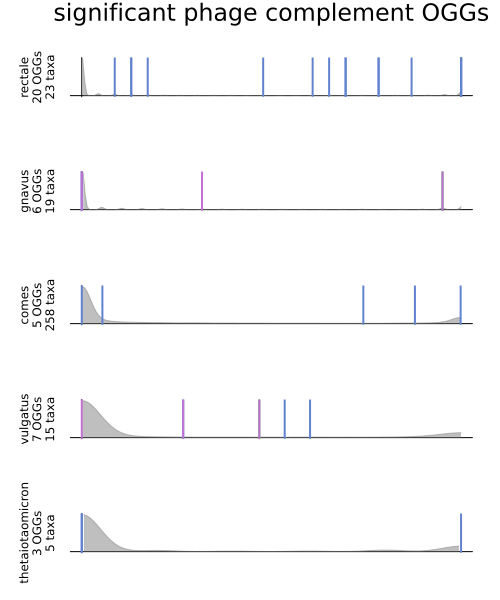

In [43]:
plot(ps..., 
    layout=grid(length(ps), 1), 
    labelfontsize=8, 
    size=(500,length(ps) * 120), 
    plot_title="significant phage complement OGGs",
    bottommargin=10Plots.Measures.mm,    
)

In [44]:
treeorder = indexin(getleafnames(uptree), uniprot.obs_names);

species_names = [
    "rectale",
    "gnavus",
    "comes",
    "vulgatus",
    "thetaiotaomicron",
]
chosen_oggss = [
    [["COG0835", "COG0842", "COG1345", "COG1344", "COG1442",
    "COG1516", "COG1776", "COG2186", "COG2198", "COG2405", 
    "COG2865", "COG2944", "COG3210", "COG3316", "COG3547", 
    "COG4495", "COG4786", "COG5001", "COG5279", "COG5444",]],

    [["COG1440","COG1447",],
    ["COG1694",],
    ["COG0531","COG1501","COG2222",]],

    [["COG0145","COG1011","COG1351","COG4951","2Z81G",]],

    [["COG0863","COG1083","COG4744",],
    ["32ZV1",],
    ["COG0666","COG2214","2Z8QV",]],

    [["COG1474","COG2942","COG3410",]],
];

# level = 3

ps = []

for (i, (species_name, chosen_oggs)) in enumerate(zip(species_names, chosen_oggss))
# (i, (species_name, chosen_oggs)) =  (1, first(zip(species_names, chosen_oggss)))
    
    # collect all parent clades
    foundtaxa = uniprot.obs[contains.(uniprot.obs.Species, species_name), [:Kingdom, :Phylum, :Class, :Order, :Family, :Genus, :Species]]
    species_node_idx = findall(contains.(uniprot.obs.Species[treeorder], species_name))[1]
    speciesnode = leafnodes[species_node_idx]
    depthofspecies = network_distance(uptree, speciesnode)
    speciesparents = []
    node = speciesnode
    for i in 1:depthofspecies
        node = parent(node)
        push!(speciesparents, node)
    end

    cladesizes = length.(getleafnames.(speciesparents))

    cladesateachtreelevel = getleafnames.(speciesparents);
    frac_present = map(cladesateachtreelevel) do clade_ids
        cladeidx = indexin(clade_ids, uniprot.obs_names)
        mean(bupmtx[cladeidx, :], dims=1) |> vec
    end |> stack
    islocallypresent = frac_present[:, 1] .== 1;


    p = plot(
        ylabel="$(species_name)\n$(length(vcat(chosen_oggs...))) OGGs\n$(cladesizes[end]) taxa",
        xlabel= i==9 ? "fractional coverage" : "", 
        framestyle=:zerolines,
        yticks=:none,
        xticks= i==9 ? :auto : :none,
        # size=(600, 200),
        margin=5Plots.Measures.mm,
    )
    density!(frac_present[:, end], c=:grey, alpha=.5, fill=0, trim=true)
    for (j, chosen_oggs_layer) in enumerate(chosen_oggs)
        chosen_oggs_idx = indexin(chosen_oggs_layer, uniprot.var_names);
        # println(chosen_oggs_idx)
        # vline!(frac_present[chosen_oggs_idx, end], c=["#6182ce",3,4][j], lw=2)
        vline!(frac_present[chosen_oggs_idx, end], c="#6182ce", lw=2)
    end
    push!(ps, p)
end

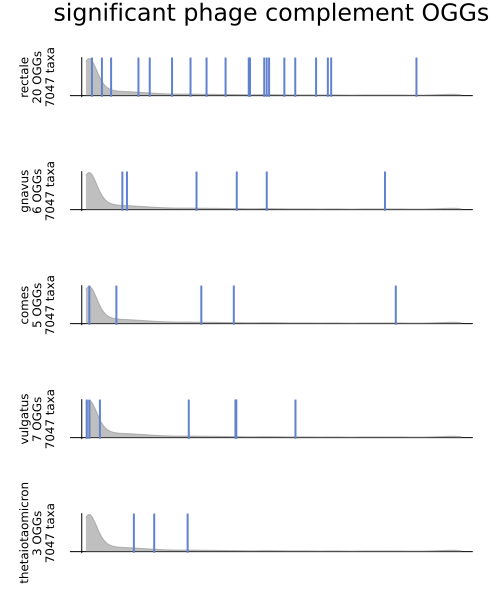

In [45]:
plot(ps..., 
    layout=grid(length(ps), 1), 
    labelfontsize=8, 
    size=(500,length(ps) * 120), 
    plot_title="significant phage complement OGGs",
    bottommargin=10Plots.Measures.mm,    
)

In [46]:
savefig(joinpath(pdir, "sigoggs_conservation_complementtophage_byspecies.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/conserved_oggs_in_uniprot/sigoggs_conservation_complementtophage_byspecies.pdf"